In [1]:
import glob
import os

import matplotlib.pyplot as plt
import numpy as np

from imcmc.color import ImageLines, GibbsUniformStrategy, GibbsIntensityStrategy, UniformLinesStrategy, UniformStrategy, IntensityMCMCStrategy, UniformPathStrategy, RandomWalkStrategy

np.random.seed(0)

WARNING (theano.configdefaults): install mkl with `conda install mkl-service`: No module named 'mkl'
/home/colin/miniconda3/envs/imcmc3.6/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
class Examples:
    """Hack to have descriptive example images."""
    
    def __init__(self):
        self._images = set()
        for suffix in (".png", ".jpg"):
            for fname in glob.glob(f"color/*{suffix}"):
                key = os.path.basename(fname)[:-len(suffix)]
                setattr(self, key, plt.imread(fname))
                self._images.add(key)
    
    def gallery(self):
        tot = len(self._images)
        cols = 4
        rows = tot // cols + int(tot % cols > 0)
        fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(rows * 5, cols * 2), constrained_layout=True)
        for ax in axes.ravel()[tot:]:
            ax.remove()
        for im, ax in zip(self._images, axes.ravel()):
            ax.imshow(getattr(self, im))
            ax.axis("off")
        return fig, axes

images = Examples()

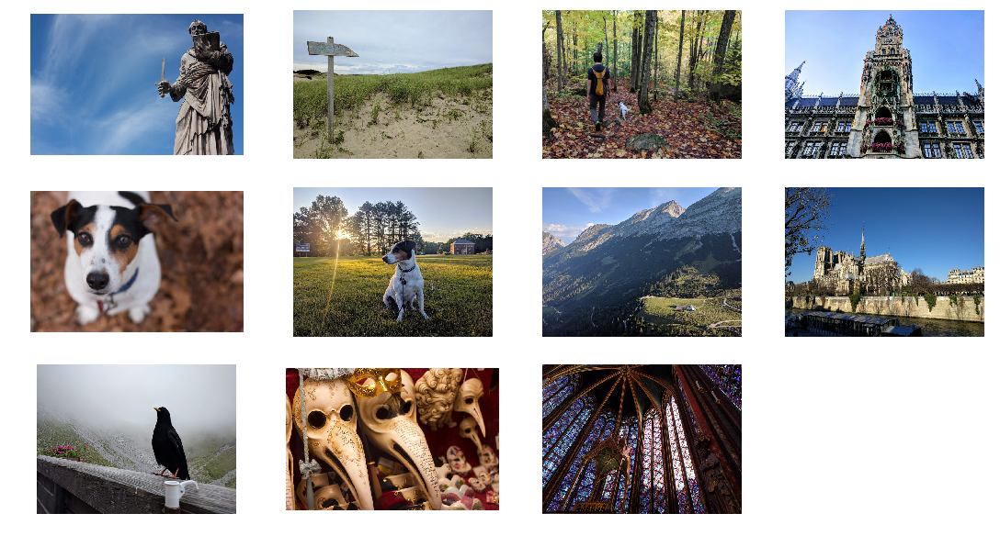

In [3]:
images.gallery();

`UniformStrategy`
-----------------

Chooses two points uniformly at random and draws a line between them.

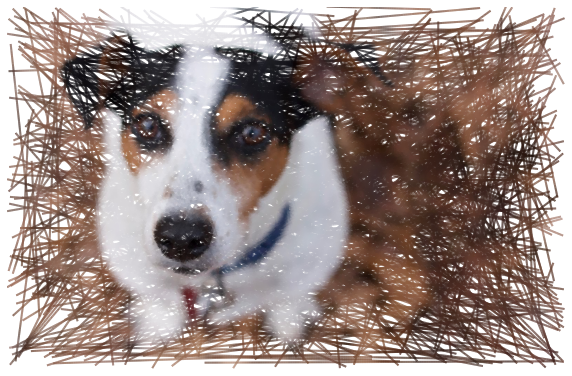

In [4]:
ImageLines(images.pete2, UniformStrategy()).plot();

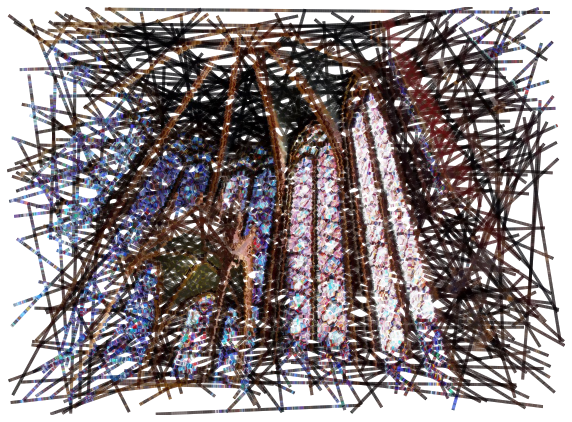

In [5]:
ImageLines(images.stchapelle, UniformStrategy()).plot(500, linewidth=3);

`UniformPathStrategy`
-----------------

Initializes randomly. Chooses one points uniformly at random and draws a line to there.

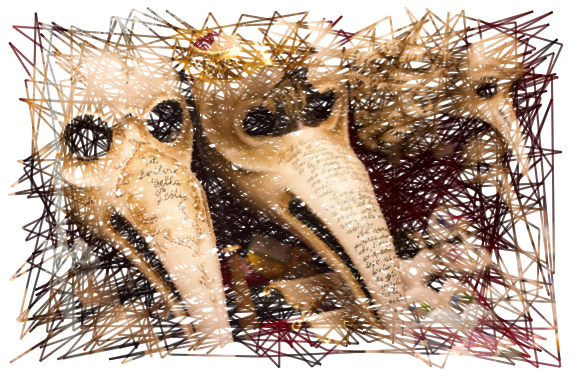

In [6]:
ImageLines(images.masks, UniformPathStrategy()).plot(700);

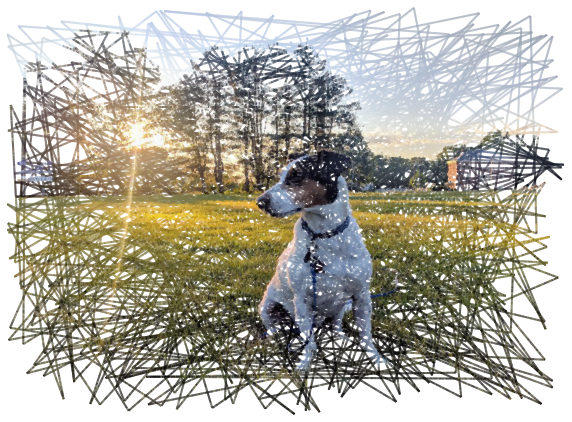

In [7]:
ImageLines(images.pete3, UniformPathStrategy()).plot(700);

`IntensityMCMCStrategy`
-----------------------

Sums the intensity of the RGB(A) channels, and interprets that as a density function to do random walk MCMC. Generally, dark areas are high probability. Set `dark=False` to make light areas have high probability, though that ends up looking pretty bad. `step_size` is in pixels. Note that this is not *actually* MCMC, for so many reasons, one of which is that I do not resample after rejecting a proposal (since that just makes plotting slower, but doesn't change the plot).

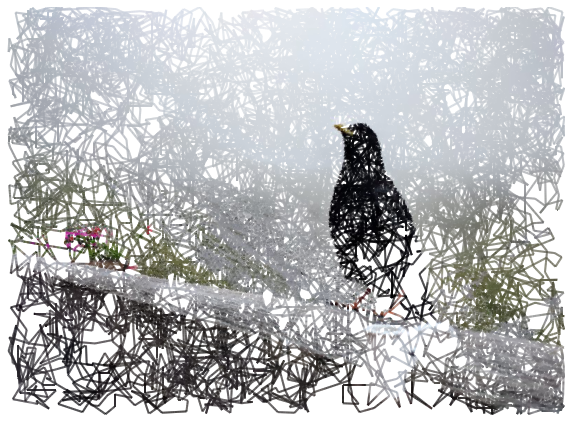

In [8]:
ImageLines(images.blackbird, IntensityMCMCStrategy(step_size=500)).plot(10_000);

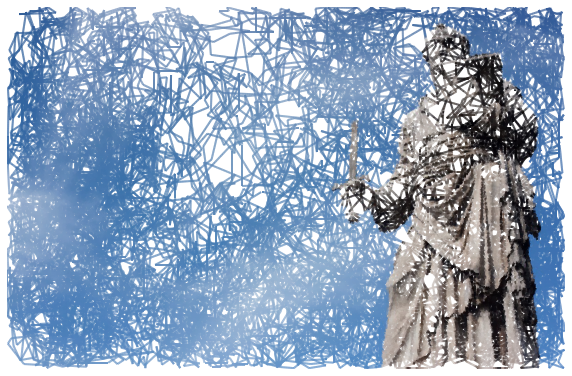

In [9]:
ImageLines(images.statue, IntensityMCMCStrategy(step_size=500)).plot(10_000);

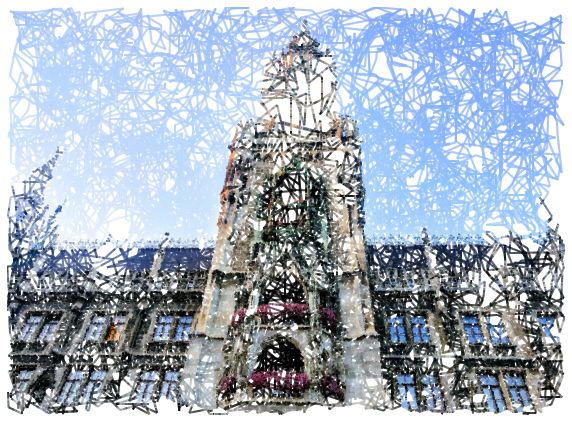

In [10]:
ImageLines(images.munchen, IntensityMCMCStrategy(step_size=500)).plot(10_000);

`RandomWalkStrategy`
--------------------

A random walk ignoring what the intensity of the pixels is. When walking outside the image, paths are reflected back into the image.

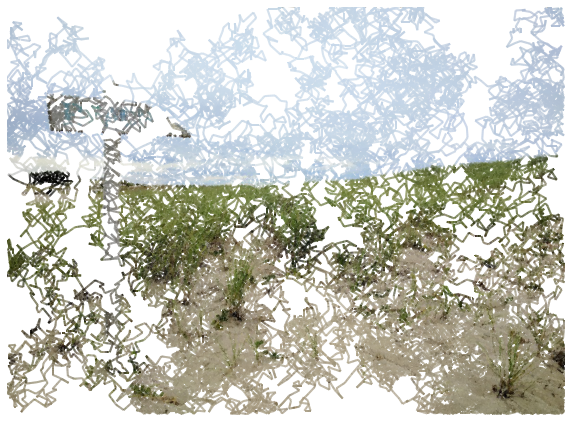

In [11]:
ImageLines(images.beach, RandomWalkStrategy()).plot(20_000);

`GibbsIntensityStrategy`
------------------------

A Gibbs sampler, alternating a vertical proposal, then a horizontal proposal. Uses the intensity of the image to make proposals, summing the RGB(A) channels. Use `dark=False` to interpret bright pixels as high probability.

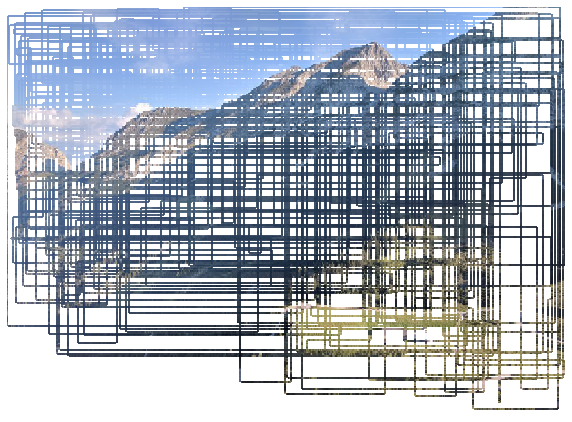

In [12]:
ImageLines(images.karwendel, GibbsIntensityStrategy(dark=False)).plot(1_000);

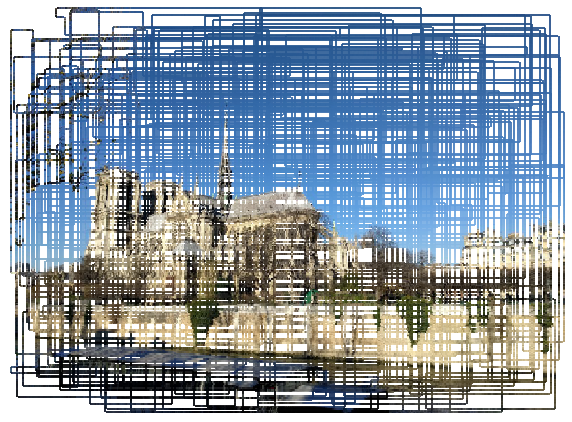

In [13]:
ImageLines(images.notredame, GibbsIntensityStrategy()).plot();

`UniformLinesStrategy`
----------------------

Sample horizontal and vertical lines uniformly, of uniformly random length, with no care given to the underlying intensity.

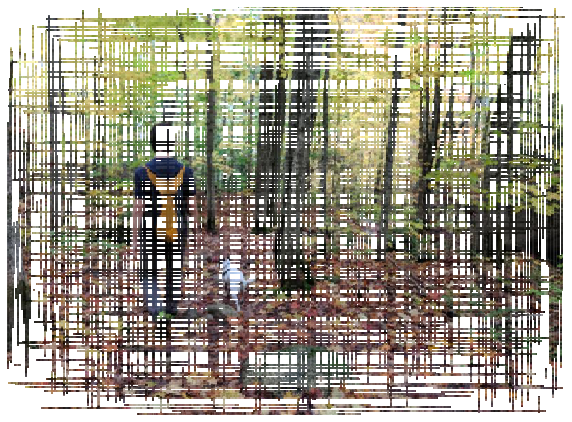

In [14]:
ImageLines(images.petewalk, UniformLinesStrategy()).plot();

In [25]:
import matplotlib.pyplot as plt

from imcmc.color import ImageLines, IntensityMCMCStrategy, UniformLinesStrategy, GibbsIntensityStrategy

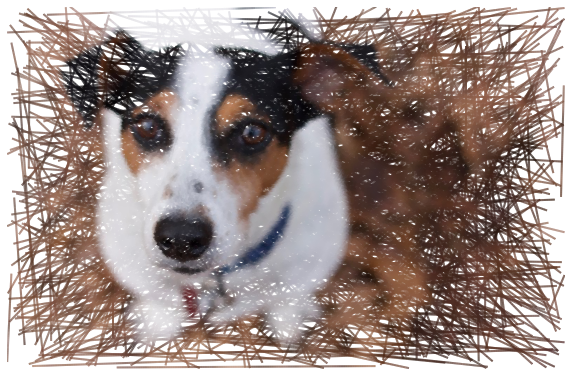

In [28]:
pete = plt.imread('color/pete2.jpg')

fig, ax = ImageLines(pete, UniformStrategy()).plot()
fig.savefig("pete.jpg")

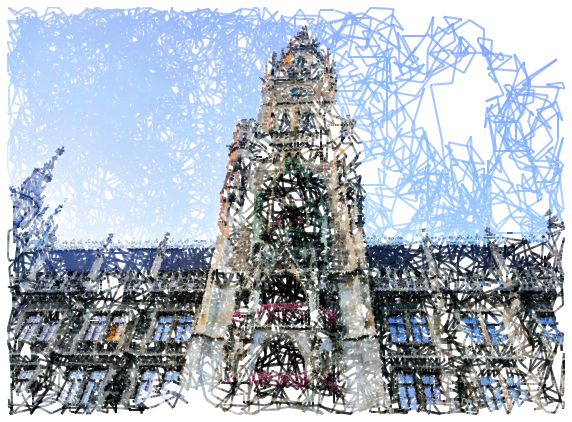

In [32]:
munchen = plt.imread('color/munchen.jpg')

fig, ax = ImageLines(munchen, IntensityMCMCStrategy(step_size=500)).plot(10_000)
fig.savefig("munchen.jpg")

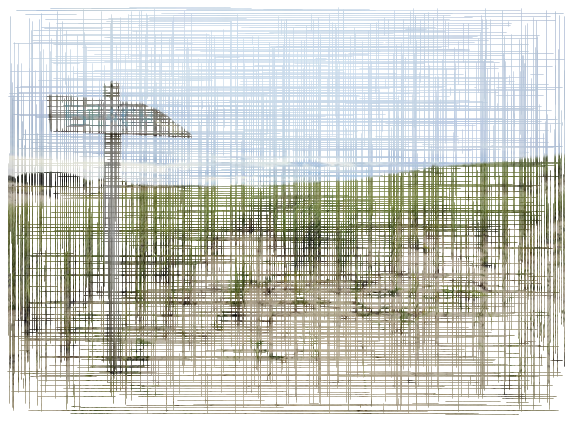

In [33]:
beach = plt.imread('color/beach.jpg')

fig, ax = ImageLines(beach, UniformLinesStrategy()).plot(1500, linewidth=1)
fig.savefig("beach.jpg")

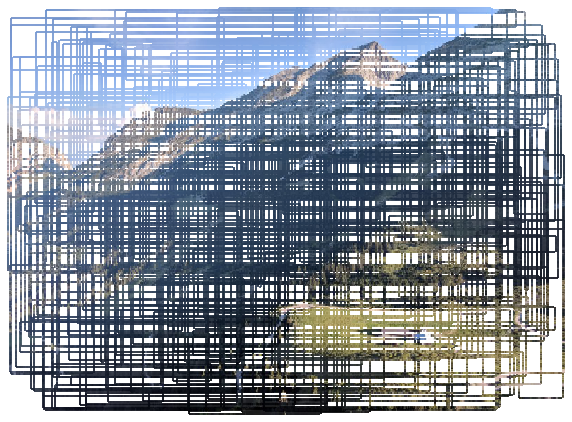

In [34]:
karwendel = plt.imread('color/karwendel.jpg')

fig, ax = ImageLines(karwendel, GibbsIntensityStrategy()).plot(1_000)
fig.savefig("karwendel.jpg")